<a href="https://colab.research.google.com/github/Lakshit2911/EDA-Capstone-Project/blob/main/Airbnb_Bookings_Analysis_Capstone_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## <b> Since 2008, guests and hosts have used Airbnb to expand on traveling possibilities and present a more unique, personalized way of experiencing the world. Today, Airbnb became one of a kind service that is used and recognized by the whole world. Data analysis on millions of listings provided through Airbnb is a crucial factor for the company. These millions of listings generate a lot of data - data that can be analyzed and used for security, business decisions, understanding of customers' and providers' (hosts) behavior and performance on the platform, guiding marketing initiatives, implementation of innovative additional services and much more. </b>

## <b>This dataset has around 49,000 observations in it with 16 columns and it is a mix between categorical and numeric values. </b>

## <b> Explore and analyze the data to discover key understandings (not limited to these) such as : 
* What can we learn about different hosts and areas?
* What can we learn from predictions? (ex: locations, prices, reviews, etc)
* Which hosts are the busiest and why?
* Is there any noticeable difference of traffic among different areas and what could be the reason for it? </b>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
sns.set()
%matplotlib inline

#NLP
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

from wordcloud import WordCloud, ImageColorGenerator
sns.set_theme(style="ticks", color_codes=True)

import statistics
from collections import Counter

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
data = pd.read_csv("/content/drive/MyDrive/Almabetter/Module 1 : Python for Data Science/Capstone/Copy of Airbnb NYC 2019.csv")


In [ ]:
data.shape

(48895, 16)

In [ ]:
data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [ ]:
data.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


Observations:

1. Min of Price variable is 0, max is 10000.
2. Mean price is 152.
3. On an average people stay 7 days in a room.
4. On an average 23 reviews are available per hotel
5. On an average 1.37 reviews are received per month

In [ ]:
data.isnull().to_string() ##Note that we use the to_string() method to return the entire DataFrame.

'          id   name  host_id  host_name  neighbourhood_group  neighbourhood  latitude  longitude  room_type  price  minimum_nights  number_of_reviews  last_review  reviews_per_month  calculated_host_listings_count  availability_365\n0      False  False    False      False                False          False     False      False      False  False           False              False        False              False                           False             False\n1      False  False    False      False                False          False     False      False      False  False           False              False        False              False                           False             False\n2      False  False    False      False                False          False     False      False      False  False           False              False         True               True                           False             False\n3      False  False    False      False                False       

In [ ]:
data.isnull().sum() #sum() returns the number of missing values in the data set

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

Observations:

1. There are total four columns with null values.
2. name column is having total 16 null values.
3. host_name is having 21 null values.
4. last_review and reviews_per_month are having more null values.
5. we will look at the columns and decide what we can do with them.

# **HANDLING MISSING VALUES**

In [ ]:
#missing value in percentage.
total = data.isnull().sum().sort_values(ascending = False)#total per column
missing_values= round(((data.isnull().sum())*100)/data.isnull().count().sort_values(ascending = False),2)
#missing_value data frame.
missing_total_percentage = pd.concat([total,missing_values],axis = 1,keys = ['Total','Percentage'],sort = False).sort_values('Total',ascending=False)
missing_total_percentage

,Total,Percentage
last_review,10052,20.56
reviews_per_month,10052,20.56
host_name,21,0.04
name,16,0.03
id,0,0.00
host_id,0,0.00
neighbourhood_group,0,0.00
neighbourhood,0,0.00
latitude,0,0.00
longitude,0,0.00


From data analysis point of view host_name will not be that important as its an catogorical feature and will have lots of catogories and this will not contribute in exploring the data and also from security point of view of host.

columns 'last_review' & 'reviews_per_month' are having lots of mission values with 20% of whole data we will replace with 0 for NA values in 'reviews_per_month' column.

We will convert its data type to catogorical feature and replace 'NA' with 'never'


**reviews_per_month 'NA' value handling:**

In [ ]:
#we can impute it with '0' as these listings didnt get any reviews yet
data.reviews_per_month.fillna(value = 0, inplace = True)
data.reviews_per_month

0        0.21
1        0.38
2        0.00
3        4.64
4        0.10
         ... 
48890    0.00
48891    0.00
48892    0.00
48893    0.00
48894    0.00
Name: reviews_per_month, Length: 48895, dtype: float64

**last_review 'NA' value handling:**

In [ ]:
data['last_review'].fillna(value = 0, inplace = True)
data['last_review']

0        2018-10-19
1        2019-05-21
2                 0
3        2019-07-05
4        2018-11-19
            ...    
48890             0
48891             0
48892             0
48893             0
48894             0
Name: last_review, Length: 48895, dtype: object

# **UNIVARIATE ANALYSIS:**

1) column_no_1:name

In [ ]:
data.name

0                       Clean & quiet apt home by the park
1                                    Skylit Midtown Castle
2                      THE VILLAGE OF HARLEM....NEW YORK !
3                          Cozy Entire Floor of Brownstone
4         Entire Apt: Spacious Studio/Loft by central park
                               ...                        
48890      Charming one bedroom - newly renovated rowhouse
48891        Affordable room in Bushwick/East Williamsburg
48892              Sunny Studio at Historical Neighborhood
48893                 43rd St. Time Square-cozy single bed
48894    Trendy duplex in the very heart of Hell's Kitchen
Name: name, Length: 48895, dtype: object

In [ ]:
data[data['name'].isnull()].head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
2854,1615764,NaN,6676776,Peter,Manhattan,Battery Park City,40.71239,-74.01620,Entire home/apt,400,1000,0,0,0.00,1,362
3703,2232600,NaN,11395220,Anna,Manhattan,East Village,40.73215,-73.98821,Entire home/apt,200,1,28,2015-06-08,0.45,1,341
5775,4209595,NaN,20700823,Jesse,Manhattan,Greenwich Village,40.73473,-73.99244,Entire home/apt,225,1,1,2015-01-01,0.02,1,0
5975,4370230,NaN,22686810,Michaël,Manhattan,Nolita,40.72046,-73.99550,Entire home/apt,215,7,5,2016-01-02,0.09,1,0
6269,4581788,NaN,21600904,Lucie,Brooklyn,Williamsburg,40.71370,-73.94378,Private room,150,1,0,0,0.00,1,0


Observation:

1. This columns is having names describing the property which is host is trying to give on rent,so the nature of this names is short and consise and this is required as this can draw an attention of customer.
2. The question arises that how to fill the missing values in this columns.we will explore further dataset and try to find out better optiions to fill the missing values.
3. Of course there is no point in removing these cells although they are limited in numbers.

In [ ]:
data.room_type

0           Private room
1        Entire home/apt
2           Private room
3        Entire home/apt
4        Entire home/apt
              ...       
48890       Private room
48891       Private room
48892    Entire home/apt
48893        Shared room
48894       Private room
Name: room_type, Length: 48895, dtype: object

In [ ]:
data.room_type.unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)

Observations

1. room_type column is not having any null values,and also we can try to use this values in place of NAN values in name column this can solve our purpose and we can atlest put front what is the type of room!
2. yes, we will replace the nan values with the values which are in room_type column.

In [ ]:
#This code snippit will replce the nan values.
#fillna() method will do the job...
data.name.fillna(data.room_type, inplace=True)
data.isnull().sum()

id                                 0
name                               0
host_id                            0
host_name                         21
neighbourhood_group                0
neighbourhood                      0
latitude                           0
longitude                          0
room_type                          0
price                              0
minimum_nights                     0
number_of_reviews                  0
last_review                        0
reviews_per_month                  0
calculated_host_listings_count     0
availability_365                   0
dtype: int64

Observations:

1. We have replaced the nan values with corresponding room_type values.
2. This should solve our purpose.

In [ ]:
#stop words removal:
"""
1) download the nltk stopwords in english.
2) replace pantuation and special symbols.
3) make it string and convert all into lower case.
then split the words and compair each with the stopwords and keep only those which are not in stopword list.
"""
def stop_word_removal(df):
  stop = stopwords.words('english')
  df.name = df.name.str.replace("[^\w\s]", "").str.lower()
  df.name = df.name.apply(lambda x: ' '.join([item for item in x.split() if item not in stop]))

In [ ]:
text = stop_word_removal(data)
text = " ".join(str(each) for each in data.name)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: FutureWarning: The default value of regex will change from True to False in a future version.
  # Remove the CWD from sys.path while we load stuff.


In [ ]:
text

'clean quiet apt home park skylit midtown castle village harlemnew york cozy entire floor brownstone entire apt spacious studioloft central park large cozy 1 br apartment midtown east blissartsspace large furnished room near bway cozy clean guest room family apt cute cozy lower east side 1 bdrm beautiful 1br upper west side central manhattannear broadway lovely room 1 garden best area legal rental wonderful guest bedroom manhattan singles west village nest superhost 2 stops manhattan studio perfect parents garden chelsea perfect hip historic brownstone apartment backyard huge 2 br upper east cental park sweet spacious brooklyn loft cbg ctybgd helpshaiti rm114 cbg helps haiti room25 cbg helps haiti rm 2 maison des sirenes1bohemian apartment sunny bedroom across prospect park magnifique suite au n de manhattan vue cloitres midtown piedaterre spacious lovely furnished manhattan bedroom modern 1 br nyc east village front roomdouble bed spacious 1 bedroom luxe building loft williamsburg are

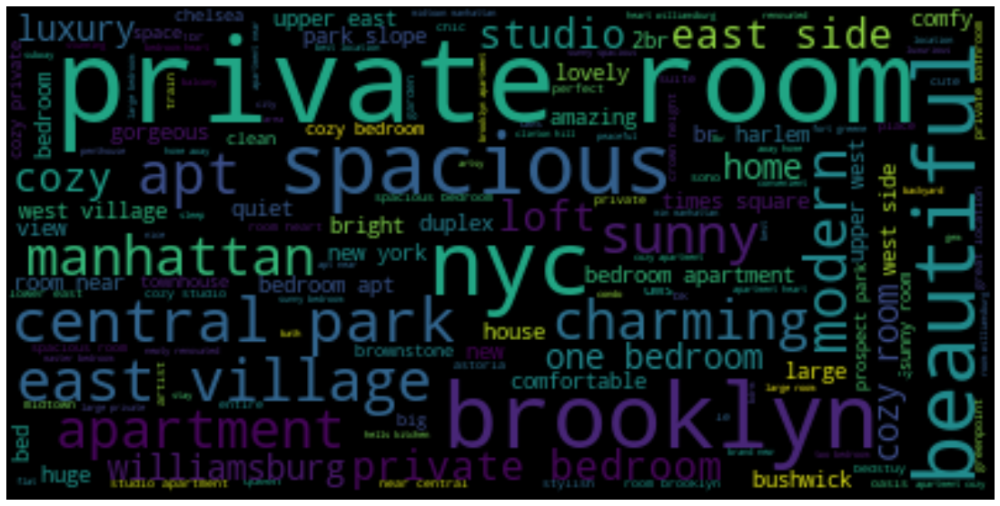

In [ ]:
wordcloud = WordCloud(max_words=300, background_color="black").generate(text)
plt.figure(figsize=(25,10))
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()
pass

Obsevations

1. This word cloud shows us the most frequent words.

In [ ]:
#after removing stop words.
data.name

0                            clean quiet apt home park
1                                skylit midtown castle
2                               village harlemnew york
3                         cozy entire floor brownstone
4          entire apt spacious studioloft central park
                             ...                      
48890    charming one bedroom newly renovated rowhouse
48891        affordable room bushwickeast williamsburg
48892             sunny studio historical neighborhood
48893               43rd st time squarecozy single bed
48894                trendy duplex heart hells kitchen
Name: name, Length: 48895, dtype: object

**Top 50 words from word_cloud:**

In [ ]:
#list of words.
name_list = list(data.name.values)
words = []
for i in name_list:
  words+=i.split()

In [ ]:
#let's see top 50 used words .
_top_50_words=Counter(words).most_common()
_top_50_words=_top_50_words[0:50]

In [ ]:
#dataFrame for top 50 words.
top_50_words = pd.DataFrame(_top_50_words,columns = ['words','frequency'])

[Text(0, 0, 'room'),
 Text(0, 0, 'bedroom'),
 Text(0, 0, 'private'),
 Text(0, 0, 'apartment'),
 Text(0, 0, 'cozy'),
 Text(0, 0, 'apt'),
 Text(0, 0, 'brooklyn'),
 Text(0, 0, 'studio'),
 Text(0, 0, 'spacious'),
 Text(0, 0, '1'),
 Text(0, 0, 'manhattan'),
 Text(0, 0, '2'),
 Text(0, 0, 'park'),
 Text(0, 0, 'east'),
 Text(0, 0, 'sunny'),
 Text(0, 0, 'williamsburg'),
 Text(0, 0, 'beautiful'),
 Text(0, 0, 'near'),
 Text(0, 0, 'village'),
 Text(0, 0, 'nyc'),
 Text(0, 0, 'heart'),
 Text(0, 0, 'large'),
 Text(0, 0, 'loft'),
 Text(0, 0, 'home'),
 Text(0, 0, 'modern'),
 Text(0, 0, 'central'),
 Text(0, 0, 'bright'),
 Text(0, 0, 'luxury'),
 Text(0, 0, '1br'),
 Text(0, 0, 'location'),
 Text(0, 0, 'west'),
 Text(0, 0, 'w'),
 Text(0, 0, 'new'),
 Text(0, 0, 'bed'),
 Text(0, 0, 'side'),
 Text(0, 0, 'charming'),
 Text(0, 0, 'bushwick'),
 Text(0, 0, 'upper'),
 Text(0, 0, 'midtown'),
 Text(0, 0, 'quiet'),
 Text(0, 0, 'one'),
 Text(0, 0, 'brownstone'),
 Text(0, 0, 'great'),
 Text(0, 0, 'br'),
 Text(0, 0, 'ha

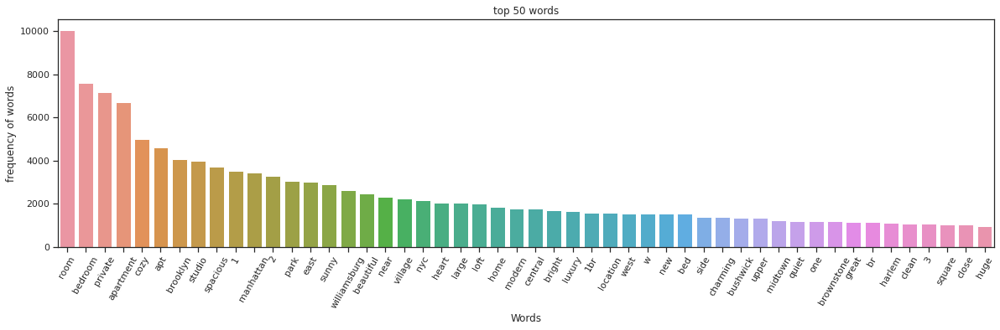

In [ ]:
# visualization
plt.figure(figsize=(20,5))
ax_1= sns.barplot(x='words',y='frequency',data = top_50_words)
ax_1.set_title('top 50 words')
ax_1.set_ylabel('frequency of words')
ax_1.set_xlabel('Words')
ax_1.set_xticklabels(ax_1.get_xticklabels(), rotation=60)

Observation

1. The above observation shows us the top 50 words and there frequency.
2. These words can he help full in model buliding point of view.

2) column_no_2 host_name:

In [ ]:
data['host_name'].nunique()


11452

Observations:

1. host_name this column is defining the name of host(owner).
2. There are 11452 unique hosts/owners we can use this featue directly in model building just by encoding it.response encoding will be usefull for this feature.
3. we can take nan value as one data point for model building

3) column_no_3 neighbourhood_group:

In [ ]:
data['neighbourhood_group']


0         Brooklyn
1        Manhattan
2        Manhattan
3         Brooklyn
4        Manhattan
           ...    
48890     Brooklyn
48891     Brooklyn
48892    Manhattan
48893    Manhattan
48894    Manhattan
Name: neighbourhood_group, Length: 48895, dtype: object

In [ ]:
data['neighbourhood_group'].unique()


array(['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx'],
      dtype=object)

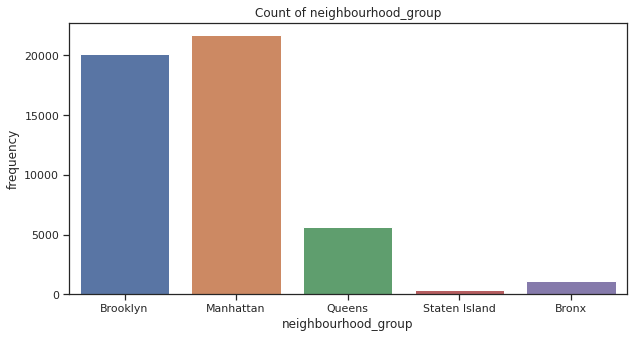

In [ ]:
#count_plot
plt.figure(figsize=(10,5))
ax_3 = sns.countplot(x='neighbourhood_group',data = data)
ax_3.set_title('Count of neighbourhood_group')
ax_3.set_ylabel('frequency')
ax_3.set_xlabel('neighbourhood_group')
plt.show()

Observations:

1. Brooklyn and Manhattan have the highest hotel/room bookings.


4) column_no_4 neighbourhood:


In [ ]:
neigh_unique_values = data['neighbourhood'].value_counts()
neigh_unique_values

Williamsburg          3920
Bedford-Stuyvesant    3714
Harlem                2658
Bushwick              2465
Upper West Side       1971
                      ... 
Fort Wadsworth           1
Richmondtown             1
New Dorp                 1
Rossville                1
Willowbrook              1
Name: neighbourhood, Length: 221, dtype: int64

Observations:

There are 221 unique neighbor.

Top 50 most common neighbours



In [ ]:
#.most_common() Return a list of the n most common elements and their counts from the most common to the least.
top_50_=Counter( data['neighbourhood']).most_common()
top_50_=top_50_[0:50]
top_50_[:20]

[('Williamsburg', 3920),
 ('Bedford-Stuyvesant', 3714),
 ('Harlem', 2658),
 ('Bushwick', 2465),
 ('Upper West Side', 1971),
 ("Hell's Kitchen", 1958),
 ('East Village', 1853),
 ('Upper East Side', 1798),
 ('Crown Heights', 1564),
 ('Midtown', 1545),
 ('East Harlem', 1117),
 ('Greenpoint', 1115),
 ('Chelsea', 1113),
 ('Lower East Side', 911),
 ('Astoria', 900),
 ('Washington Heights', 899),
 ('West Village', 768),
 ('Financial District', 744),
 ('Flatbush', 621),
 ('Clinton Hill', 572)]

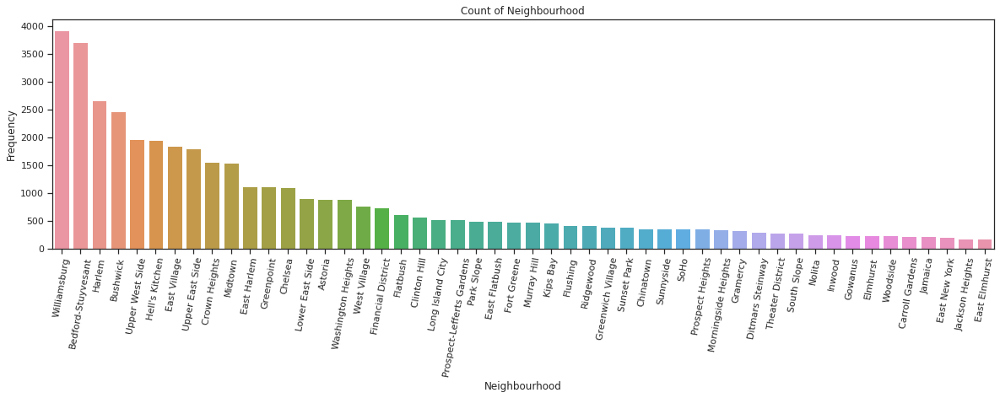

In [ ]:
#count_plot
plt.figure(figsize=(20,5))
ax_4 = sns.barplot(x='neighbourhood',y='count',data = pd.DataFrame(top_50_,columns=['neighbourhood','count'][:20]))
ax_4.set_title('Count of Neighbourhood')
ax_4.set_ylabel('Frequency')
ax_4.set_xlabel('Neighbourhood')
ax_4.set_xticklabels(ax_4.get_xticklabels(), rotation=80);
plt.show()

Observations:

1. The above plot shows us some of the top Neighbours towns we can say.
2. People like to stay at these towns more offent.

5) column_no_5 latitude & longitude:


In [ ]:
data[['latitude','longitude']]


,latitude,longitude
0,40.64749,-73.97237
1,40.75362,-73.98377
2,40.80902,-73.94190
3,40.68514,-73.95976
4,40.79851,-73.94399
...,...,...
48890,40.67853,-73.94995
48891,40.70184,-73.93317
48892,40.81475,-73.94867
48893,40.75751,-73.99112


Observation:

1. we can see the exact locations from this columns.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


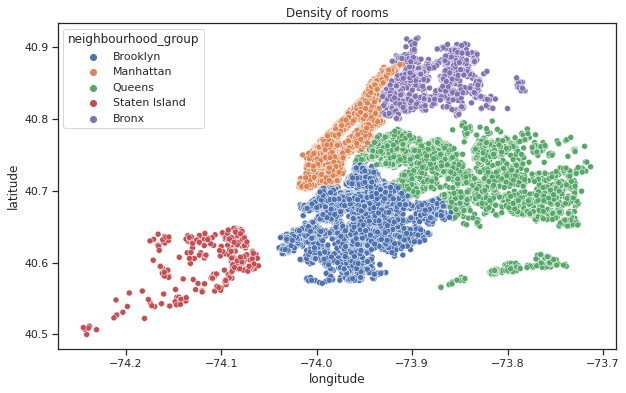

In [ ]:
#simple scatterplot:
plt.figure(figsize=(10,6))
ax_5 = sns.scatterplot(data.longitude,data.latitude,hue=data.neighbourhood_group)
ax_5.set_title('Density of rooms')
ax_5.set_ylabel('latitude')
ax_5.set_xlabel('longitude')
plt.show()

Observations

latitude and longtitude visulalizes us that Brooklyn and Manhattan are the most dense with hotels and apartments followed by queens island.


6) Column_no_6 room_type:


In [ ]:
data[['room_type']].nunique()


room_type    3
dtype: int64

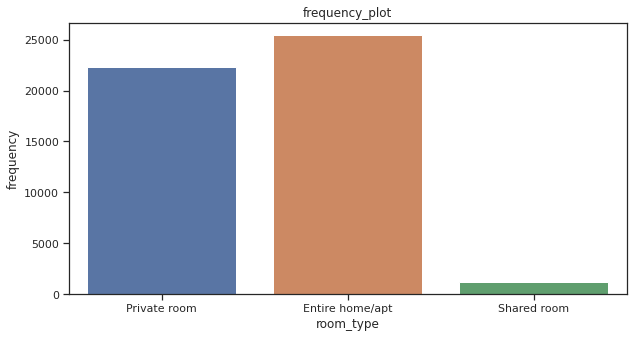

In [ ]:
#count_plot'
plt.figure(figsize=(10,5))
sns_6 = sns.countplot(x='room_type',data = data)
sns_6.set_title('frequency_plot')
sns_6.set_ylabel('frequency')
sns_6.set_xlabel('room_type')

plt.show()

Observations

1. There are three types of rooms
2. Namely:
  1. Private room
  2. Entire home/apt room_type
  3. Shared room.
  4. People mostly prefered to take whole apartment on rent followed by Private room.
3. very few people prefered to have shared rooms.

We will try to catogorise the 'price'like cheep,affordable and expensive and then analyse the 'price' for 'room_type' as per it.

7) column_no_7 price:


In [ ]:
data[['price']].describe()


,price
count,48895.000000
mean,152.720687
std,240.154170
min,0.000000
25%,69.000000
50%,106.000000
75%,175.000000
max,10000.000000


In [ ]:
#function to catogory the types of rooms.
def price_catagory(price):
  if price<=80:
    return 'cheep'
  elif price>=80 and price<=500:
    return 'affordable'
  else:
    return 'Expensive'


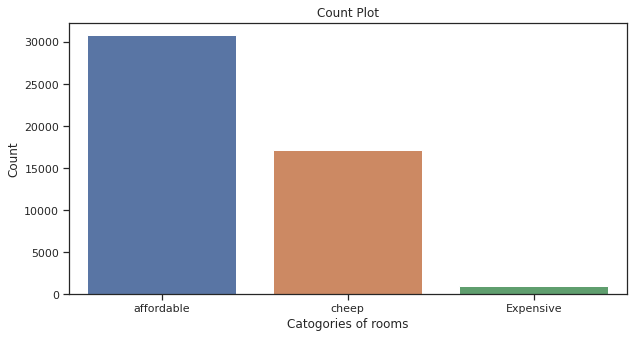

In [ ]:
plt.figure(figsize=(10,5))
ax_7 = sns.countplot(x=data['price'].apply(price_catagory))
ax_7.set_title('Count Plot')
ax_7.set_xlabel('Catogories of rooms')
ax_7.set_ylabel("Count")
plt.show()


Observations

1. we have considered to devide the whole price range into three catogories
  1.   cheep (price range below or equal to 80 dollars)
  2.   affordable(for price range 80 to 500 dollars)
  3.   expensive(for price range more then 500 dollars) so, it look like people have more intrest in having "affordable" rooms/apartments rathre then having cheep and expensive rooms.

8) column_no_8 minimum_nights:


In [ ]:
data[['minimum_nights']].value_counts()


minimum_nights
1                 12720
2                 11696
3                  7999
30                 3760
4                  3303
                  ...  
182                   1
183                   1
184                   1
185                   1
1250                  1
Length: 109, dtype: int64

In [ ]:
data[['minimum_nights']].describe()


,minimum_nights
count,48895.000000
mean,7.029962
std,20.510550
min,1.000000
25%,1.000000
50%,3.000000
75%,5.000000
max,1250.000000


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


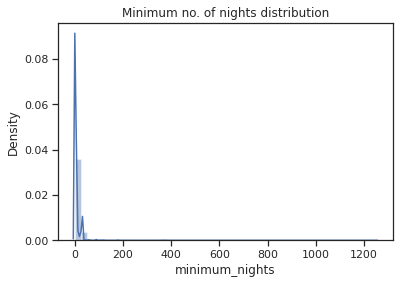

In [ ]:
ax = sns.distplot(data.minimum_nights)
plt.title('Minimum no. of nights distribution')
plt.show()


Observations

1. most of the neights booked are from 0 to less then 100 days. we will plot further and see.
2. we can see that there may be outliers.we can plot and check it.
3. we will plot box plot and check.
4. log scale can show us the shape of skewed data.